In [2]:
import sys 
sys.path.insert(0, '../')
from correction.data.my_dataloader import WRFDataset, custom_collate, find_files
from correction.models.loss import TurbulentMSE
from correction.data.train_test_split import split_train_val_test
from correction.config.config import cfg
from correction.models.changeToERA5 import MeanToERA5
from correction.helpers.interpolation import InvDistTree
from correction.helpers.plot_utils import arcs
from correction.helpers import plot_utils
from torch.utils.data import DataLoader
import torch.nn as nn
import scipy
import matplotlib.pyplot as plt
import numpy as np
import pickle
from matplotlib import colors
import matplotlib
import torch
import xarray as xr
import pendulum as pdl
import netCDF4

C:\Users\Viktor\ml\WRFCorrection\notebooks\..\correction\config
Device is: cuda


In [3]:
batch_size = 32
wrf_vars = ['uvmet10', 'T2']
era_vars=['u10', 'v10', 't2m']
wrf_folder = 'C:\\Users\\Viktor\\Desktop\\wrf_test'
era_folder = 'C:\\Users\\Viktor\\Desktop\\era_test'
# wrf_folder1 = 'C:\\Users\\Viktor\\Desktop\\wrf2gpn_test\\t2'
scatter_file = ['scatter/cmems_obs-wind_glo_phy_nrt_l3-metopb-ascat-asc-0.125deg_P1D-i_multi-vars_22.31E-75.94E_62.31N-78.69N_2019-01-01-2023-10-11.nc',
                'scatter/cmems_obs-wind_glo_phy_nrt_l3-metopb-ascat-des-0.125deg_P1D-i_multi-vars_22.31E-75.94E_62.31N-78.69N_2019-01-01-2023-10-11.nc']
stations_folder = 'stations'
station_files = find_files(stations_folder, '*') 

In [4]:
train_files, val_files, test_files = split_train_val_test(wrf_folder, era_folder, 0.7, 0.1, 0.2)

C:/Users/Viktor/Desktop/wrf_test/wrfout_d01_2019-01-01_000000 C:/Users/Viktor/Desktop/wrf_test/wrfout_d01_2019-01-01_000000 - wrf border dates
Using dates from 2019-01-01 to 2019-01-01


In [19]:
train_files[0]

['C:/Users/Viktor/Desktop/wrf_test/wrfout_d01_2019-01-01_000000']

In [22]:
ds = xr.open_dataset(train_files[0][0])

In [26]:
(ds['XTIME'].data.astype('datetime64[h]') - ds['XTIME'].data.astype('datetime64[D]')).astype(int) / 24

array([0.        , 0.04166667, 0.08333333, 0.125     , 0.16666667,
       0.20833333, 0.25      , 0.29166667, 0.33333333, 0.375     ,
       0.41666667, 0.45833333, 0.5       , 0.54166667, 0.58333333,
       0.625     , 0.66666667, 0.70833333, 0.75      , 0.79166667,
       0.83333333, 0.875     , 0.91666667, 0.95833333])

In [4]:
train_dataset = WRFDataset(train_files[0], train_files[1], station_files=station_files, scatter_files=scatter_file, use_spatiotemporal_encoding=False, use_time_encoding=False)
dataloader = DataLoader(train_dataset, batch_size=1, shuffle=True, collate_fn=custom_collate, num_workers=0)

2 wrf_files length
2 era_files length
(48, 46, 4) 2019-01-01T00:00:00+00:00 2019-01-02T23:00:00+00:00 stations dates range
0 2 scatter slices
Zeros in indices!
0.013888888888888892 sigma_squared
Zeros in indices!
0.013888888888888892 sigma_squared
0.6132274385133707 ======================= orig u scatter mean
-7.337604850716491 ======================= orig v scatter mean
(2, 2, 4, 132, 430) scatter data shape


In [5]:
a = next(iter(dataloader))

In [6]:
metadata = train_dataset.metadata
scat_coords = np.stack([metadata['scat_xx'].flatten(), metadata['scat_yy'].flatten()]).T

In [10]:
x = np.arange(48).reshape(2, 2, 3, 4)
s = x.shape
x.reshape(*s[:-2], -1)

array([[[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11],
        [12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]],

       [[24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35],
        [36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]]])

In [17]:
a[3].shape

torch.Size([12, 2, 2, 4, 132, 430])

In [11]:
import torchvision.transforms as transforms

In [33]:
metadata['scat_xx'].shape

(132, 430)

In [36]:
resize = transforms.Resize((13, 43))
sc = resize(a[3][:,:,::2].flatten(1,3))
scx = resize(torch.from_numpy(metadata['scat_xx'])[None])
scy = resize(torch.from_numpy(metadata['scat_yy'])[None])
scc = np.stack([scx.flatten(), scy.flatten()]).T

In [41]:
s = a[3].shape
a[3].shape, a[3].reshape(*s[:-2],-1).shape

(torch.Size([1, 2, 2, 4, 132, 430]), torch.Size([1, 2, 2, 4, 56760]))

In [42]:
def create_mask_by_nearest_to_nans(wind, coords, ):
    nn_ids = InvDistTree(coords, coords, n_near=9).ix
    s = wind.shape
    print(s)
    num_neighbour_nans = np.isnan(wind.reshape(*s[:-2],-1)[..., nn_ids]).sum(-1)
    print(num_neighbour_nans.shape)
    mask = np.ones_like(wind.reshape(*s[:-2],-1))
    print(mask.shape)
    mask[np.where(num_neighbour_nans > 0)] = np.nan
    return mask.reshape(*s)

In [43]:
mask = create_mask_by_nearest_to_nans(a[3], scat_coords)
print(mask.shape)

Zeros in indices!
0.013888888888888892 sigma_squared
torch.Size([1, 2, 2, 4, 132, 430])
torch.Size([1, 2, 2, 4, 56760])
(1, 2, 2, 4, 56760)
(1, 2, 2, 4, 132, 430)


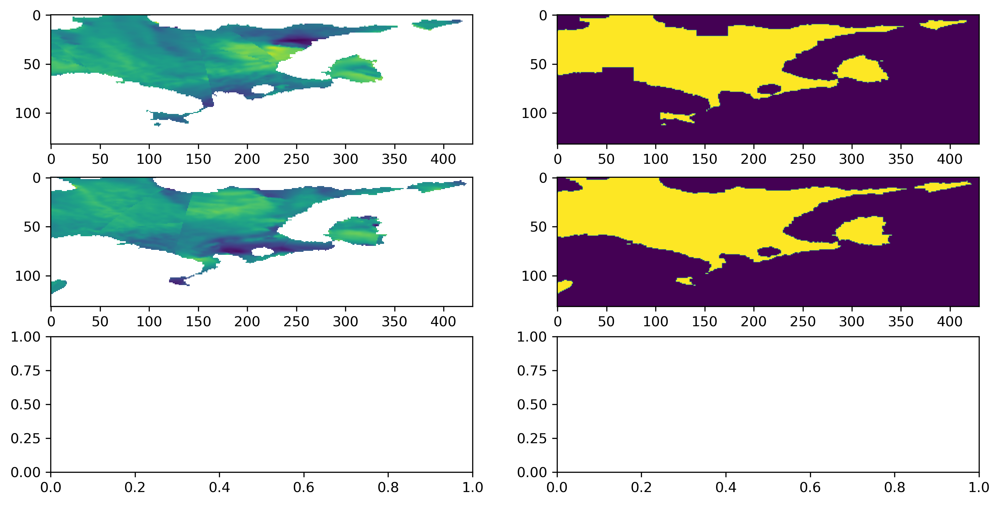

In [6]:
fig, axs = plt.subplots(3, 2, figsize=(12,6), dpi=300)
axs[1][0].imshow(a[3][0,0,1,0])
axs[1][1].imshow(a[3][0,0,1,2])
axs[0][0].imshow(a[3][0,0,0,0])
axs[0][1].imshow(a[3][0,0,0,2])
# axs[2][0].imshow(a[3][0,0,0,1])
# axs[2][1].imshow(a[3][0,0,0,1]*mask[0,0,0,1], interpolation='none')

In [6]:
scxx, scyy = train_dataset.metadata['scat_xx'], train_dataset.metadata['scat_yy'] 
wrfxx, wrfyy = train_dataset.metadata['wrf_xx'], train_dataset.metadata['wrf_yy'] 

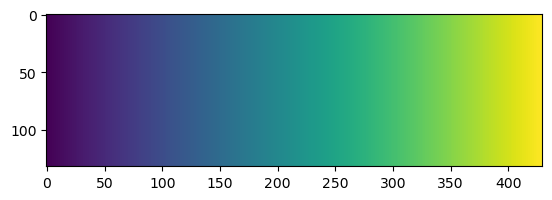

In [8]:
plt.imshow(scxx)

In [9]:
scatter = a[3]
wrf = a[0]

In [10]:
scatter.shape

torch.Size([12, 2, 4, 132, 430])

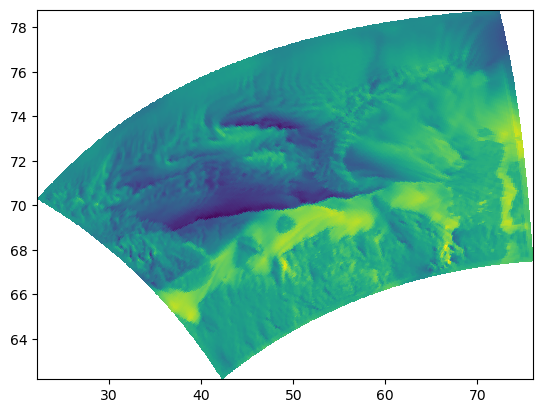

In [11]:
plt.pcolormesh(wrfxx, wrfyy, wrf[0, 2, 0])

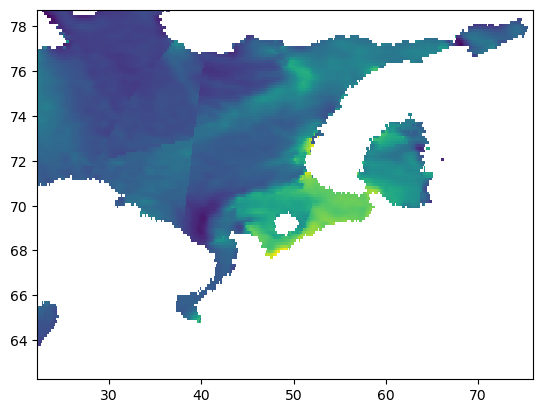

In [22]:
plt.pcolormesh(scxx, scyy, scatter[0, 0, 1])

In [7]:
ds1 = xr.open_dataset(scatter_file[0])
ds2 = xr.open_dataset(scatter_file[1])

In [46]:
ds1['measurement_time'].data.shape, ds1['measurement_time'].data.shape
np.nanmax(ds1['measurement_time'].data[45])

1.55025536e+18

In [39]:
pdl.DateTime(2019, 1, 1).timestamp()

1546290000.0

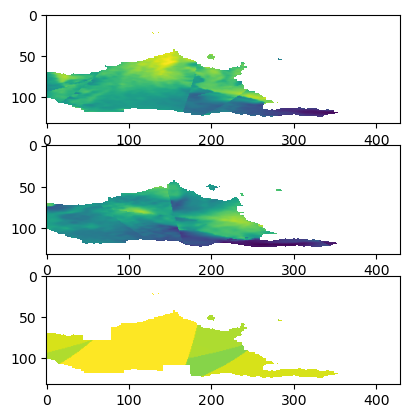

In [58]:
ds1['measurement_time'].data, ds1['measurement_time'].data
fig, axs = plt.subplots(3, 1)
axs[0].imshow(ds1['eastward_wind'].data[45])
axs[2].imshow(ds1['eastward_wind'].data[45]+ds1['measurement_time'].data[45], vmin=1.55015536e+18)
axs[1].imshow(ds2['eastward_wind'].data[45])

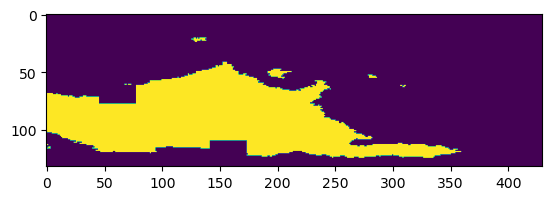

In [60]:
plt.imshow((np.isnan(ds1['eastward_wind'][45].data) * -1 + 1)*(np.isnan(ds1['measurement_time'][45].data) * -1 + 1))

In [6]:
misc = 50

In [9]:
eramapfname = f'err_maps/m_{misc}/era_err_map'
scatmapfname = f'err_maps/m_{misc}/scat_err_map'
scatmapfname1 = f'err_maps/m_{misc}/scat_err_map_orig'
scat_counts_fname = f'err_maps/m_{misc}/scat_counts'
stationfname = f'err_maps/m_{misc}/station_err_map'

station_err_map = torch.load(stationfname)
era_err_map = torch.load(eramapfname)
scat_err_map = torch.load(scatmapfname)
scat_err_map_orig = torch.load(scatmapfname1)
scat_counts = torch.load(scat_counts_fname)

# era_err_map = era_err_map.mean([0, 1])
# scat_err_map = scat_err_map.mean([0, 1, 2])
# station_err_map = station_err_map.mean(0)


In [11]:
era_err_map.shape

torch.Size([3, 14405])

In [6]:
metadata = train_dataset.metadata
era_coords = np.stack([metadata['era_xx'].flatten(), metadata['era_yy'].flatten()]).T
wrf_coords = np.stack([metadata['wrf_xx'].flatten(), metadata['wrf_yy'].flatten()]).T
scat_coords = np.stack([metadata['scat_xx'].flatten(), metadata['scat_yy'].flatten()]).T
meaner = MeanToERA5('wrferaMapping.npy',
                    era_coords=era_coords, wrf_coords=wrf_coords,
                    weighted=True)
stations_interpolator = InvDistTree(x=wrf_coords, q=metadata['coords'])
scat_interpolator = InvDistTree(x=wrf_coords, q=scat_coords)
criterion = TurbulentMSE(meaner, [1, 1, 1, 1], stations_interpolator, scat_interpolator,
                         kernel_type=cfg.run_config.loss_kernel).to(cfg.GLOBAL.DEVICE)

0.00248639776839831 sigma_squared
6.666769554553968 sigma_squared


In [13]:
def draw_station_metrics(metadata, wrf_sample, stations_t2_metric, stations_w10_metric):   
    fig, ax = plt.subplots(dpi=800)
    cmap = plt.cm.get_cmap('Reds')
    norm = colors.Normalize(vmin=0, vmax=1.3)

    plt.scatter(metadata['coords'][:, 0], metadata['coords'][:, 1], label='t2/w10 station metric', s=0.2)
    plt.pcolormesh(metadata['wrf_xx'], metadata['wrf_yy'], wrf_sample, shading='auto')

    theta1, theta2 = 90, 90 + 180
    radius = 0.2

    arcs(metadata['coords'][:, 0], metadata['coords'][:, 1], 3 * radius, radius, theta1=theta1, theta2=theta2,
         color=cmap(norm(stations_t2_metric.cpu().numpy())))
    arcs(metadata['coords'][:, 0], metadata['coords'][:, 1], 3 * radius, radius, theta1=theta2, theta2=theta1,
         color=cmap(norm(stations_w10_metric.cpu().numpy())))
    ax.set_xticks([])
    ax.set_yticks([])
    plt.legend()

    fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation='vertical', fraction=0.1)

In [14]:
def calc_era_error_map(wrf, era, meaner):
    fig, axs = plt.subplots(3, 1, figsize=(12, 12))
    
    t = era.flatten(-2, -1)
    t = t[..., meaner.mapping.unique().long()]
    err = torch.nn.L1Loss(reduction='none')(t.cuda(), meaner(wrf.cuda())).cpu()
    print(err.shape, 'err shape')
    base = torch.zeros_like(era.flatten(-2, -1)).cpu()
    print(base.shape, err.shape, 'base.shape, err.shape')
    base[..., meaner.mapping.unique().long()] = err.float()
    print(base.shape)

    xx = era_coords[:, 0]
    yy = era_coords[:, 1]
    axs[0].imshow(base.mean([0, 1])[0].reshape(67, 215), extent=[0, 280, 0, 210], vmin=0,interpolation='none',)
    axs[1].imshow(base.mean([0, 1])[1].reshape(67, 215), extent=[0, 280, 0, 210], vmin=0,interpolation='none',)
    axs[2].imshow(base.mean([0, 1])[2].reshape(67, 215), extent=[0, 280, 0, 210], vmin=0,interpolation='none',)

def calc_scat_error_map(wrf, scatter, criterion, i, start_date):
    wrf_scattered, counts = criterion.prepare_scat_data(wrf[..., :2, :, :], scatter.cuda(), i, start_date, return_counts=True)
    fig, axs = plt.subplots(5, 1)
    print(counts.shape, counts, 'counts !')
    axs[0].imshow(wrf_scattered[4, 0, 0].reshape(132, 430).cpu(), vmin=-20)
    axs[1].imshow(scatter[4, 0, 0], vmin=-20)
    err = torch.nn.L1Loss(reduction='none')(wrf_scattered, scatter[:, :, :2].flatten(-2, -1).cuda()).cpu()
    print(err.max(), err.shape)
    axs[2].imshow(err.mean([0, 1, 2]).reshape(132, 430))
    axs[3].imshow(counts.sum([0, 1]).reshape(132, 430).cpu())
    print((err.sum([0, 1])/counts.sum([0, 1]).cpu()).shape)
    a = (err.sum([0, 1])/counts.sum([0, 1]).cpu())
    axs[4].imshow((err.sum([0, 1])/counts.sum([0, 1]).cpu())[0].reshape(132, 430))
    return a

In [7]:
from correction.helpers.plot_utils import *

torch.Size([12, 4, 3, 8744])
torch.Size([4, 12, 3, 210, 280]) torch.Size([4, 12, 3, 67, 215]) torch.Size([12, 4, 46, 4]) torch.Size([12, 2, 4, 132, 430]) tensor([15, 41, 34, 32,  5, 38, 40, 36, 27, 43, 13, 21])


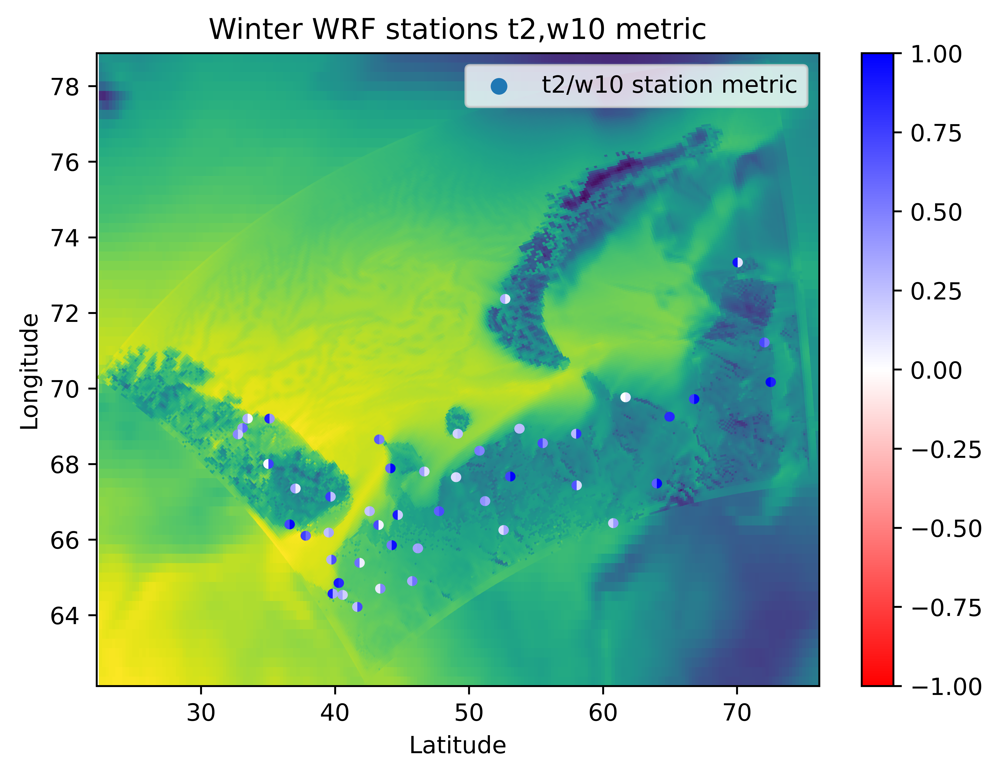

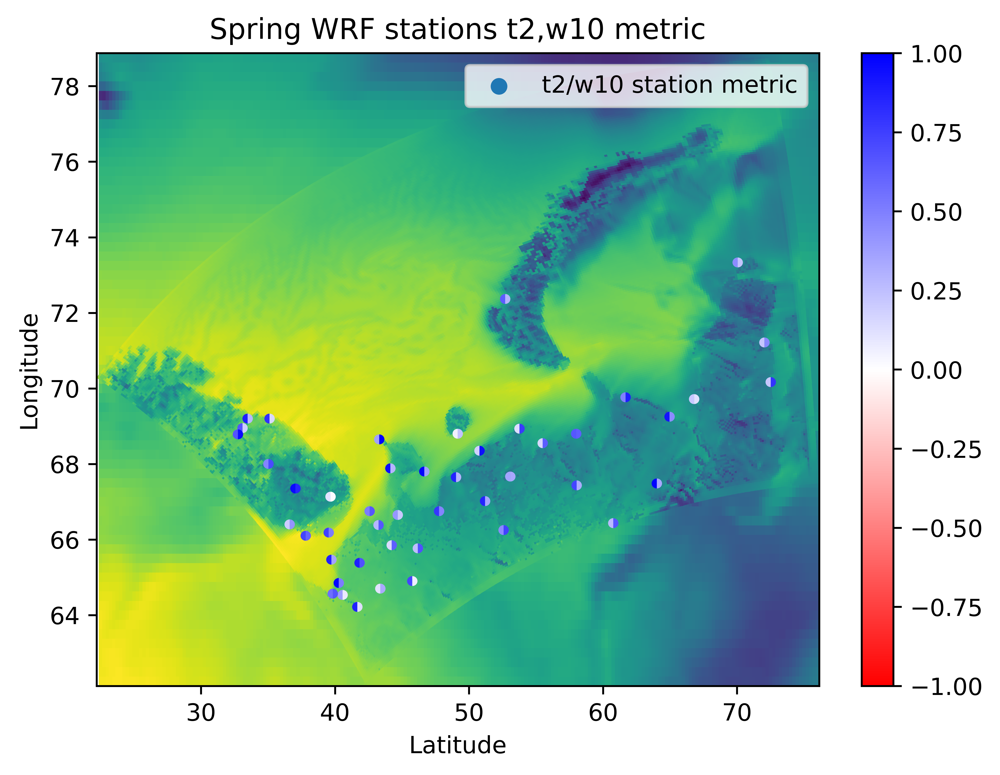

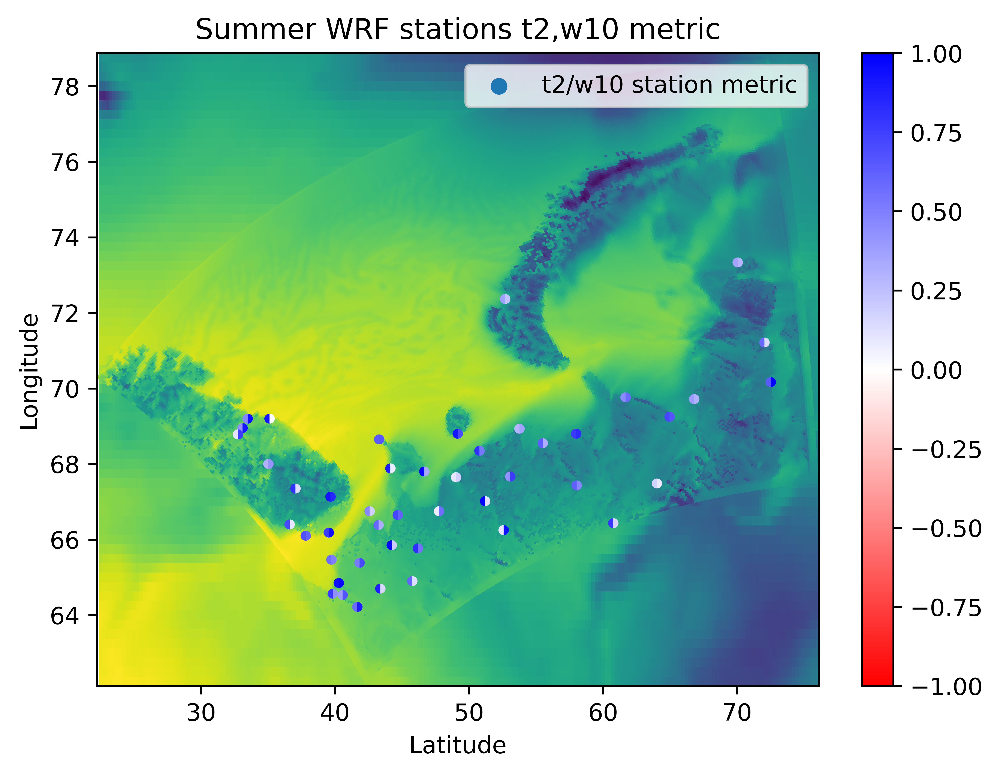

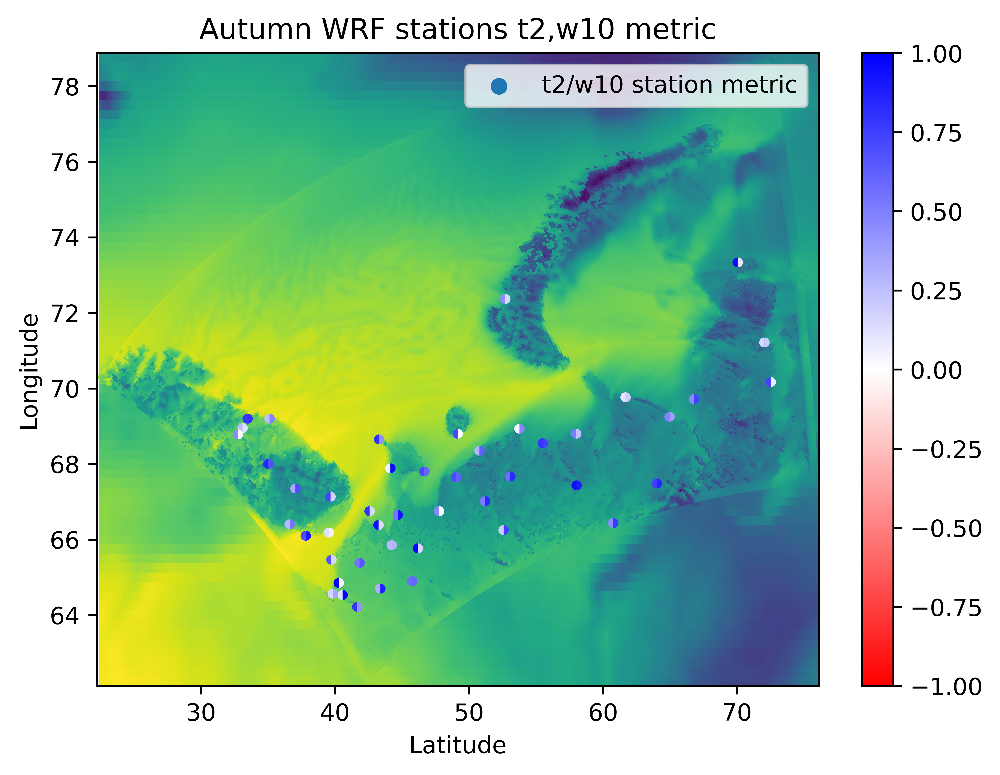

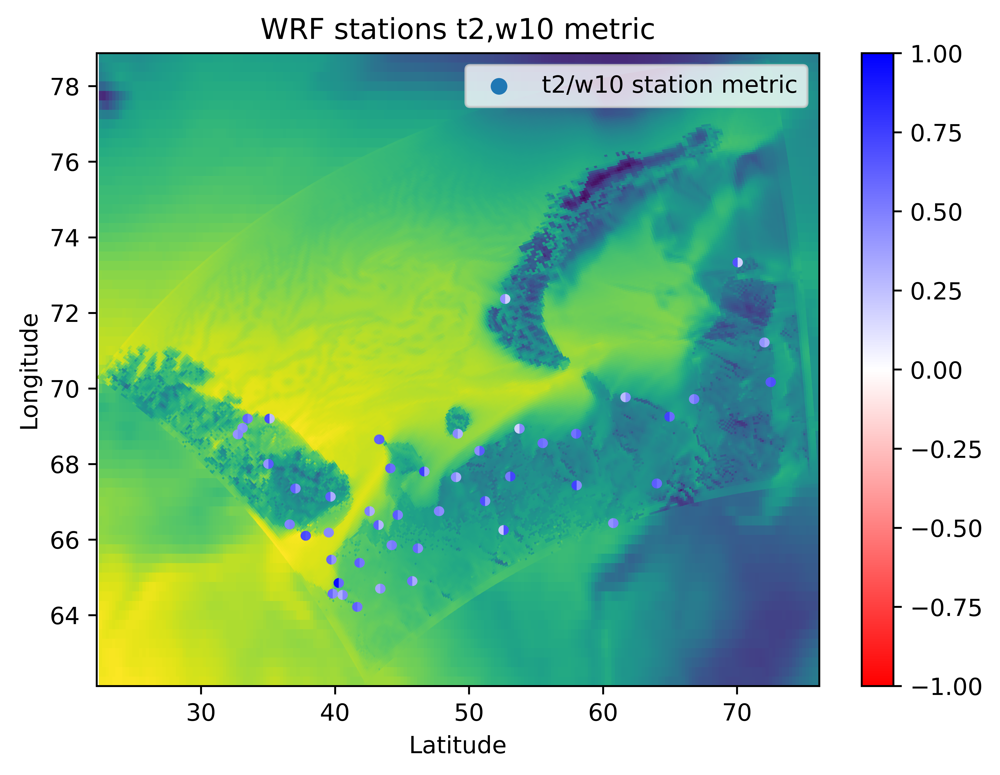

In [8]:
for test_data, test_label, station, scatter, i in dataloader:
    print(meaner(test_data.cuda()).shape)
    test_data = torch.swapaxes(test_data.type(torch.float).cuda(), 0, 1)
    test_label = torch.swapaxes(test_label.type(torch.float).cuda(), 0, 1)
    print(test_data.shape, test_label.shape, station.shape, scatter.shape, i)
    metadata = dataloader.dataset.metadata
    figs = draw_seasonal_stations_error_map(torch.rand([4, 3, 46]), metadata, test_data, test_label)
#     calc_era_error_map(test_data, test_label, meaner)
#     a = calc_scat_error_map(test_data, scatter, criterion, i, metadata['start_date'])
    break

In [11]:
[f.savefig(f'{i}.png') for i, f in figs.items()]

[None, None, None, None, None]

In [ ]:
figs

In [31]:
np.percentile(scat_err_map.numpy(), 99)

nan

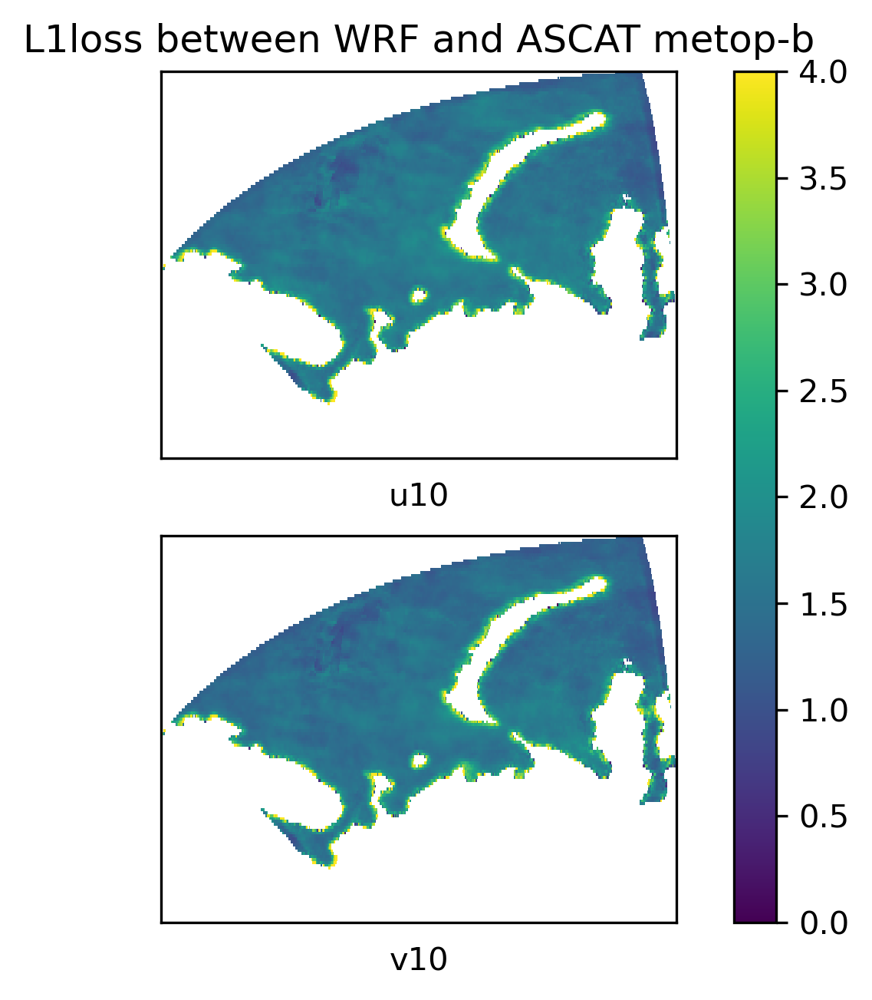

In [57]:
fig, axs = plt.subplots(2, dpi=300)
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[0].set_xlabel('u10')
axs[1].set_xlabel('v10')

im = axs[0].imshow(scat_err_map_orig[0].reshape(132,430), interpolation='none', extent=[0, 280, 0, 210], vmin=0, vmax=4)
im = axs[1].imshow(scat_err_map[0].reshape(132,430), interpolation='none', extent=[0, 280, 0, 210], vmin=0, vmax=4)

fig.colorbar(im, ax=axs, orientation='vertical', fraction=0.1)

axs[0].title.set_text('L1loss between WRF and ASCAT metop-b')

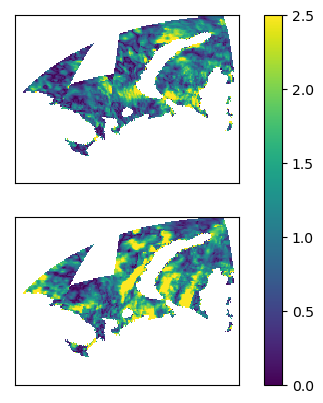

In [142]:
fig, axs = plt.subplots(2)
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[1].set_xticks([])
axs[1].set_yticks([])
im = axs[0].imshow((scat_err_map.sum([0, 1])/scat_counts.sum([0, 1]))[0].reshape(132,430), interpolation='none', extent=[0, 280, 0, 210], vmin=0, vmax=2.5)
im = axs[1].imshow((scat_err_map.sum([0, 1])/scat_counts.sum([0, 1]))[1].reshape(132,430), interpolation='none', extent=[0, 280, 0, 210], vmin=0, vmax=2.5)

fig.colorbar(im, ax=axs, orientation='vertical', fraction=0.1)

In [110]:
print(scat_err_map.shape, scat_counts[:, :, None].shape)
scat_err_map / scat_counts[:, :, None]

torch.Size([1, 2, 2, 56760]) torch.Size([1, 2, 1, 56760])


tensor([[[[nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan]],

         [[nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan]]]])

tensor([0., 0., 0.,  ..., 0., 0., 0.])

In [138]:
(scat_err_map.sum([0, 1])/scat_counts.sum([0, 1])).shape

torch.Size([2, 56760])

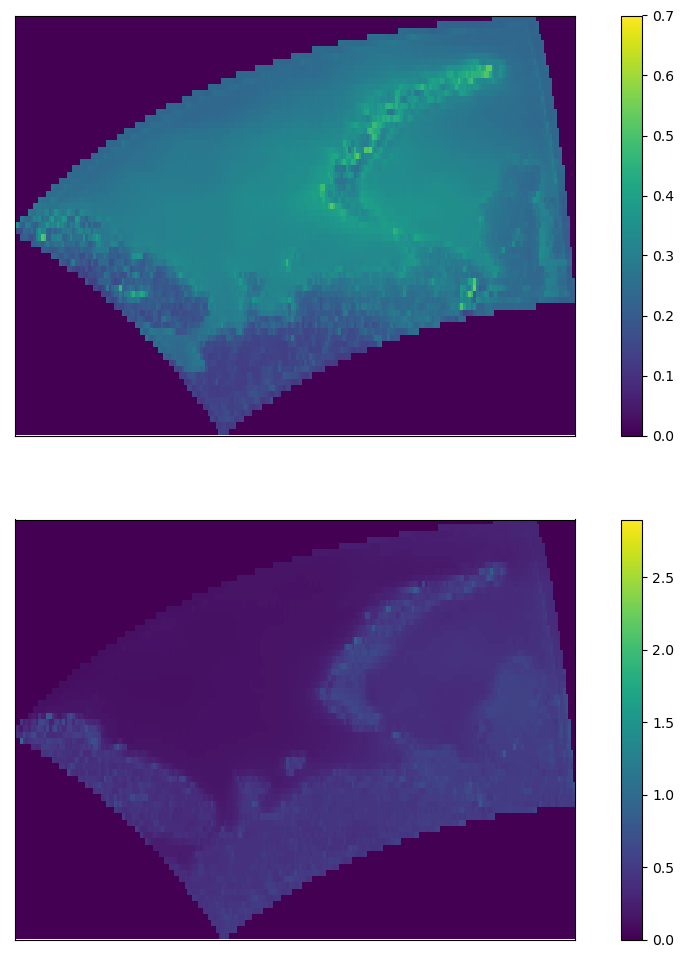

In [98]:
fig, axs = plt.subplots(2, 1, figsize=(12, 12))
vmin=era_err_map
for i in range(2):
    axs[i].set_xticks([])
    axs[i].set_yticks([])
im1 = axs[0].imshow(((era_err_map[0]+era_err_map[1])/2).reshape(67,215), interpolation='none', extent=[0, 280, 0, 210], vmin=0, vmax=0.7)
im2 = axs[1].imshow(era_err_map[2].reshape(67,215), interpolation='none', extent=[0, 280, 0, 210], vmin=0, vmax=2.9)
fig.colorbar(im1, ax=axs[0], orientation='vertical', fraction=0.1)
fig.colorbar(im2, ax=axs[1], orientation='vertical', fraction=0.1)

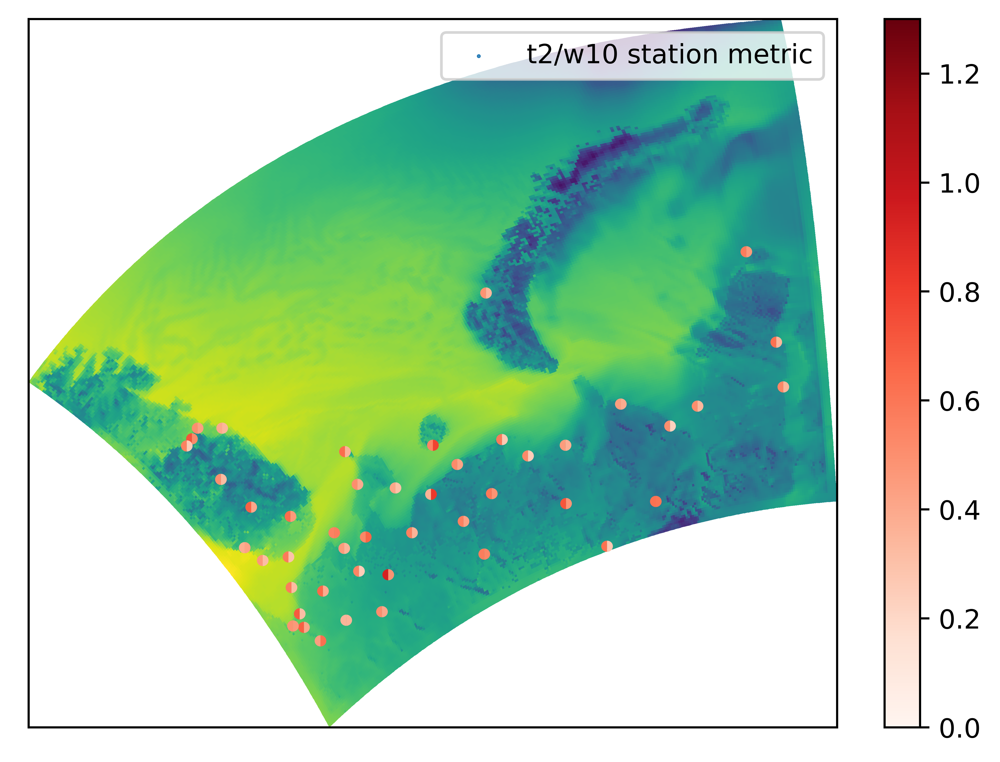

In [99]:
wrf_sample = train_dataset[12][0].data[0, 2]
draw_station_metrics(metadata, wrf_sample, station_err_map[:, 0], station_err_map[:, 1])

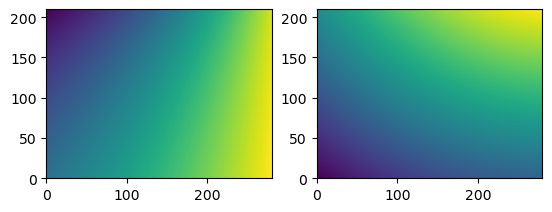

In [7]:
fig, axs = plt.subplots(1, 2)
axs[0].imshow(train_dataset[1][0][0, 5], interpolation='none', extent=[0,280,0,210])
axs[1].imshow(train_dataset[1][0][0, 4], interpolation='none', extent=[0,280,0,210])

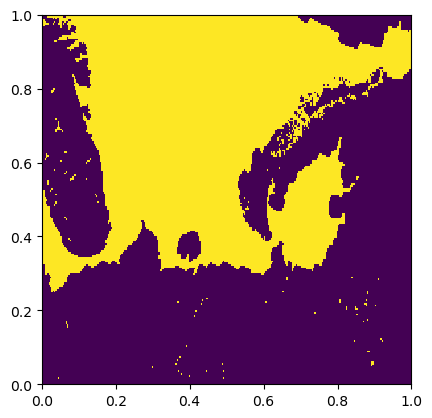

In [8]:
plt.imshow(train_dataset[1][0][0, 3]==0, interpolation='none', extent=[0,1,0,1])

In [9]:
mask = train_dataset[1][0][0, 5]*(train_dataset[1][0][0, 3]==0)

In [10]:
wrf = train_dataset[12][0]
wrfdata = torch.from_numpy(wrf.data)

In [11]:
class GaussianLayer(nn.Module):
    def __init__(self, k=21):
        super(GaussianLayer, self).__init__()
        self.seq = nn.Conv2d(3, 3, k, stride=1, padding=k//2, bias=False, groups=3, padding_mode='replicate')
        self.k = k
        self.weights_init()

    def forward(self, x):
        return self.seq(x)

    def weights_init(self):
        n = np.zeros((self.k, self.k))
        n[self.k//2, self.k//2] = 1
        kk = scipy.ndimage.gaussian_filter(n, sigma=3)
        for name, f in self.named_parameters():
            f.data.copy_(torch.from_numpy(kk))

In [12]:
layer = GaussianLayer(21).float()

In [13]:
layer.seq.weight.size()

torch.Size([3, 1, 21, 21])

In [14]:
wrfdata.dtype

torch.float64

In [15]:
def get_delta_wrf(k, wrf):
    l = GaussianLayer(k).float()
    return (wrf.float() - l(wrf.float())).detach()

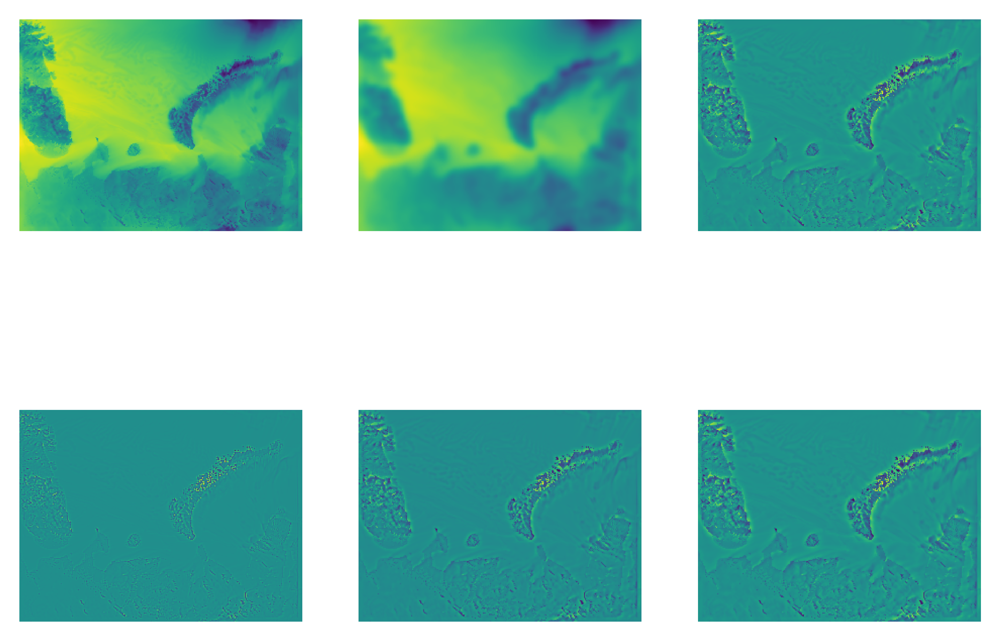

In [16]:
fig, axs = plt.subplots(2, 3, dpi=600)
c = 2
# im = plt.imshow(layer(wrfd[:, :3])[0, 2].numpy())
# im = plt.imshow((wrfd[:, :3]-layer(wrfd[:, :3]))[0, 0].numpy())
axs[0][0].set_axis_off()
axs[0][1].set_axis_off()
axs[0][2].set_axis_off()
im0 = axs[0][0].imshow(wrfdata[:, :3][0, c])
im1 = axs[0][1].imshow(layer(wrfdata[:, :3].float())[0, c].detach())
im2 = axs[0][2].imshow((wrfdata[:, :3][0, c] - layer(wrfdata[:, :3].float())[0, c]).detach())

axs[1][0].set_axis_off()
axs[1][1].set_axis_off()
axs[1][2].set_axis_off()
im2 = axs[1][0].imshow(get_delta_wrf(3, wrfdata[:, :3])[0, c].numpy())
im2 = axs[1][1].imshow(get_delta_wrf(7, wrfdata[:, :3])[0, c].numpy())
im2 = axs[1][2].imshow(get_delta_wrf(11, wrfdata[:, :3])[0, c].numpy())

# fig.colorbar(im1, orientation='vertical')
# fig.colorbar(im2, orientation='vertical')

NameError: name 'wrfd' is not defined

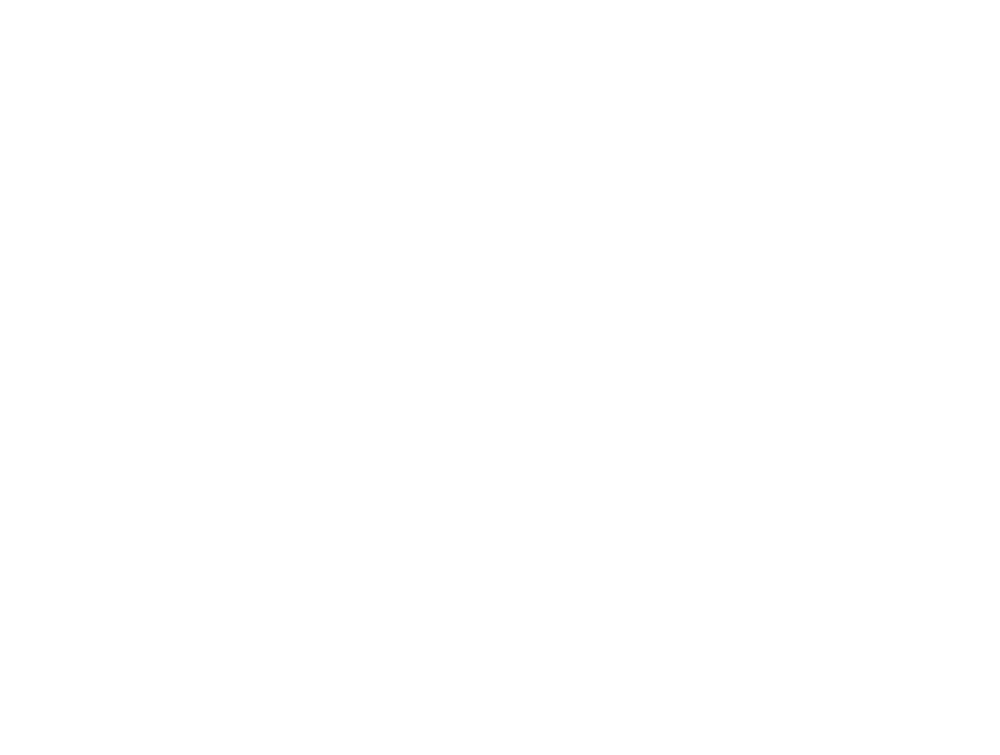

In [17]:
fig, axs = plt.subplots(1, 2, dpi=200)

# im = plt.imshow(layer(wrfd[:, :3])[0, 2].numpy())
# im = plt.imshow((wrfd[:, :3]-layer(wrfd[:, :3]))[0, 0].numpy())
axs[0].set_axis_off()
axs[1].set_axis_off()
vmin, vmax = -10, +10
im0 = axs[0].imshow(wrfd[:, :3][0, 0].numpy(), vmin=vmin, vmax=vmax)
im2 = axs[1].imshow((wrfd[:, :3]-wrfd[:, :3].mean(dim=(-1, -2))[:,:, None, None])[0, 0].numpy(),vmin=vmin, vmax=vmax)

-11.916459083557129 12.277414321899414 1.0055152423841522
-14.518040657043457 12.87357234954834 -0.9534894873619527
242.63848876953125 274.8406982421875 263.09785115508
0.0 1.0 0.5696088435374149
62.22972869873047 78.75765991210938 70.55977967502308
22.318695068359375 76.013427734375 51.56884701320103
-0.9997863151782553 0.9999870986601385 0.05432544699665557
-0.9999678989505117 1.0 0.002923087546359826


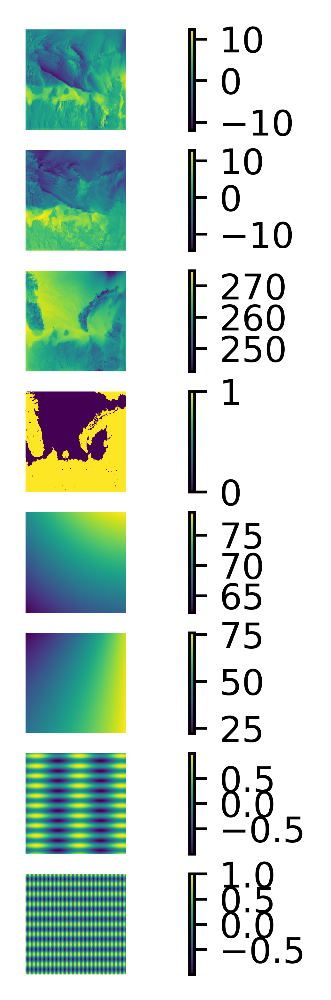

In [18]:

wrf = train_dataset[12][0]
c = wrf.shape[1]
fig, axs = plt.subplots(c, dpi=800)
for j in range(c):
    axs[j].set_axis_off()
    im1 = axs[j].imshow(wrf[0, j], interpolation='none', extent=[0,1,0,1])
    print(wrf[0, j].min(), wrf[0, j].max(), wrf[0, j].mean())
    fig.colorbar(im1, orientation='vertical')


(1, 4, 210, 280) (1, 4, 210, 280) (4, 6, 210, 280)
(1, 4, 210, 280) (1, 4, 210, 280) (4, 6, 210, 280)
(4, 8, 210, 280) (4, 3, 67, 215)
(1, 4, 210, 280) (1, 4, 210, 280) (4, 6, 210, 280)
(1, 4, 210, 280) (1, 4, 210, 280) (4, 6, 210, 280)
248.63396170990166 274.06496183504737 264.3677041065683
242.63848876953125 274.8406982421875 263.09785115508


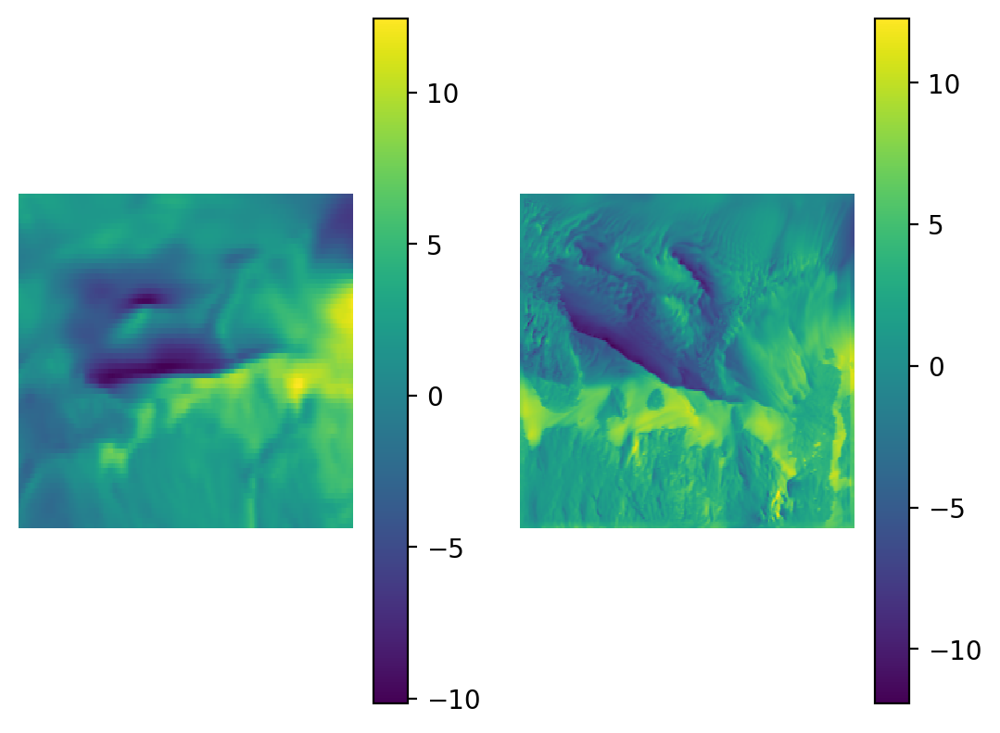

In [7]:

for i in range(12, len(train_dataset)):
    print(train_dataset[i][0].shape, train_dataset[i][1].shape)
    wrf  = train_dataset[i][0]
    era = train_dataset[i][1]
    fig, axs = plt.subplots(1, 2, dpi=200)
    axs[0].set_axis_off()
    axs[1].set_axis_off()
    im1 = axs[0].imshow(era[0, 0], interpolation='none', extent=[0,1,0,1])
    im2 = axs[1].imshow(wrf[0, 0], interpolation='none', extent=[0,1,0,1])
    print(era[0, 2].min(), era[0, 2].max(), era[0, 2].mean())
    print(wrf[0, 2].min(), wrf[0, 2].max(), wrf[0, 2].mean())
    fig.colorbar(im1, orientation='vertical')
    fig.colorbar(im2, orientation='vertical')
    break

In [27]:
from correction.hko.scalers import StandardScaler
import os
era_scaler = StandardScaler()
wrf_scaler = StandardScaler()
era_scaler.apply_scaler_channel_params(torch.load(os.path.join('logs', 'era_means')),
                                       torch.load(os.path.join('logs', 'era_stds')))
wrf_scaler.apply_scaler_channel_params(torch.load(os.path.join('logs', 'wrf_means')),
                                       torch.load(os.path.join('logs', 'wrf_stds')))
train_data = wrf_scaler.channel_transform(torch.from_numpy(train_dataset[1][0]), 1)
train_label = era_scaler.channel_transform(torch.from_numpy(train_dataset[1][1]), 1)

tensor(62.2297) tensor(2.7228) tensor(0.3126)


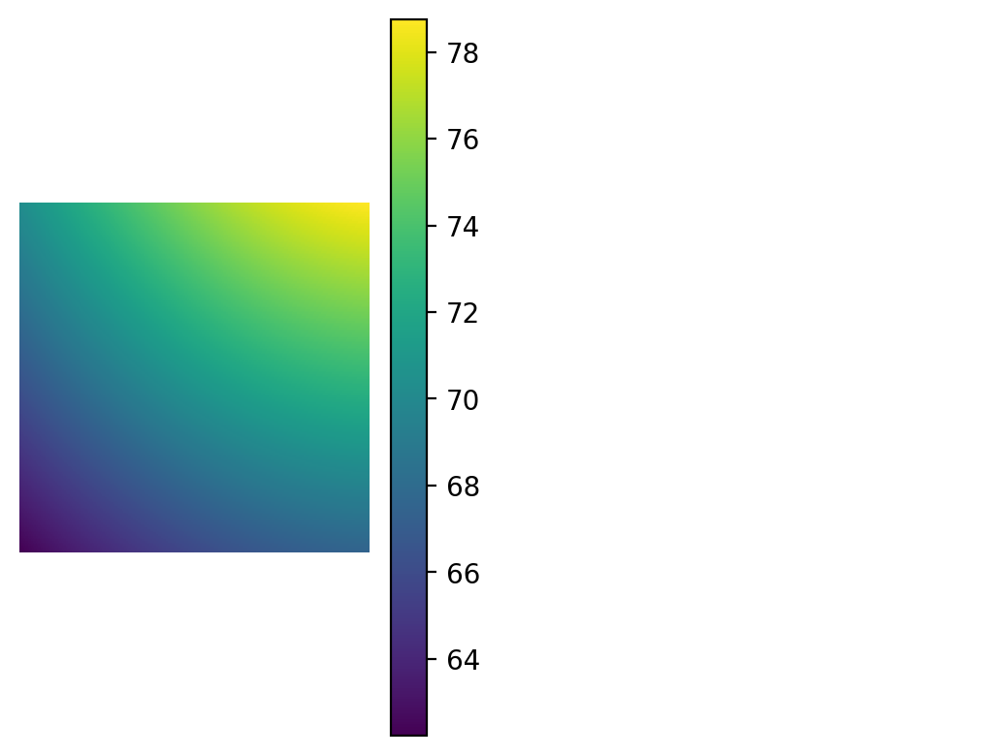

In [49]:
field_id = 4
fig, axs = plt.subplots(1, 2, dpi=200)
axs[0].set_axis_off()
axs[1].set_axis_off()
im1 = axs[0].imshow(train_data[0, field_id], interpolation='none', extent=[0,1,0,1])
# im2 = axs[1].imshow(train_label[0, field_id], interpolation='none', extent=[0,1,0,1])
print(train_data[0, field_id].min(), train_data[0, 0].max(), train_data[0, 0].mean())
# print(train_label[0, field_id].min(), train_label[0, 0].max(), train_label[0, 0].mean())
fig.colorbar(im1, orientation='vertical')
# fig.colorbar(im2, orientation='vertical')

In [1]:
import torch

In [10]:
i = torch.ones([4, 3, 210, 280])

In [11]:
for ii in torch.split(i, 3, dim=-3):
    print(ii.shape)

torch.Size([4, 3, 210, 280])
